loading annotations into memory...
Done (t=2.16s)
creating index...
index created!


C:\Users\rahul\AppData\Local\Programs\Python\Python310\lib\site-packages\albumentations\core\validation.py:114: UserWarning: ShiftScaleRotate is a special case of Affine transform. Please use Affine transform instead.
  original_init(self, **validated_kwargs)
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0836544..2.6399999].


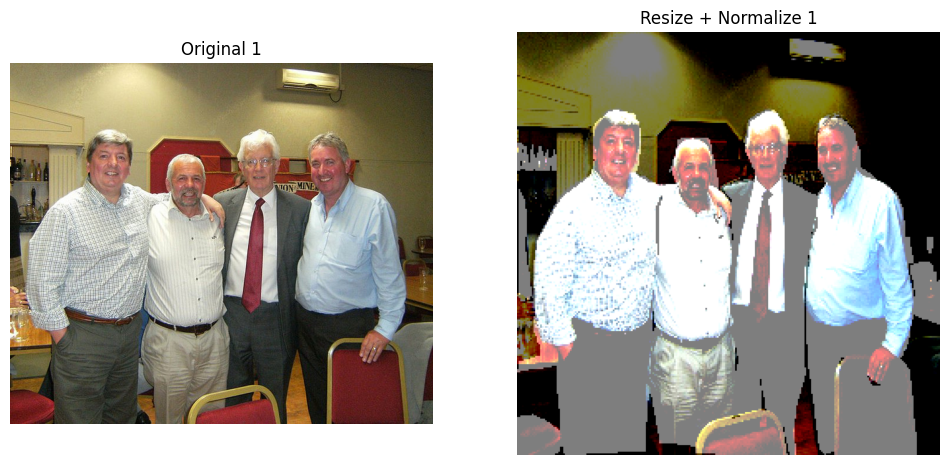

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0836544..2.6225708].


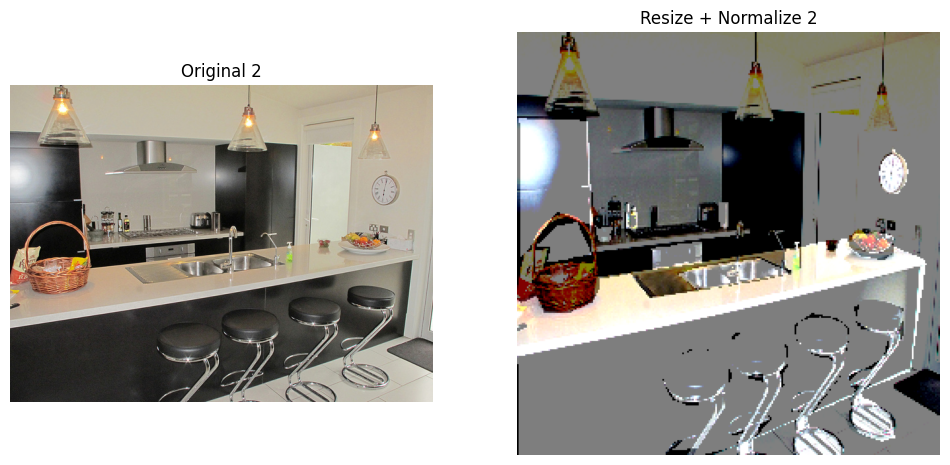

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.3410363].


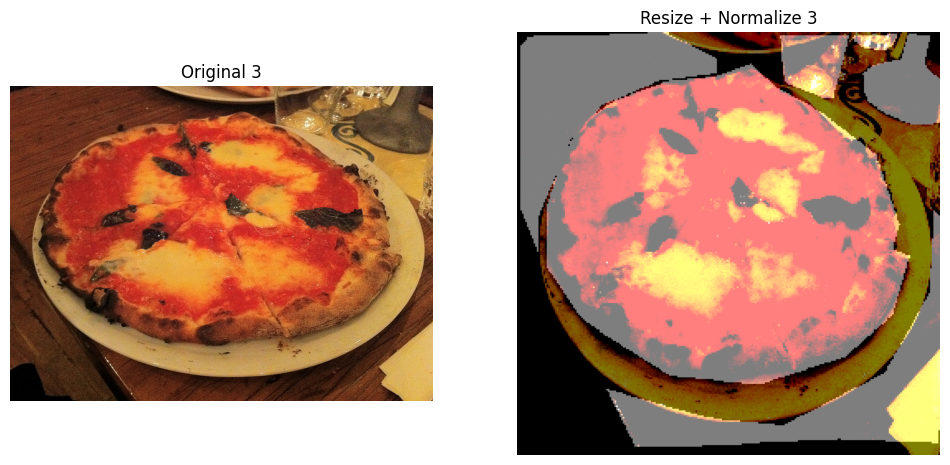

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.6399999].


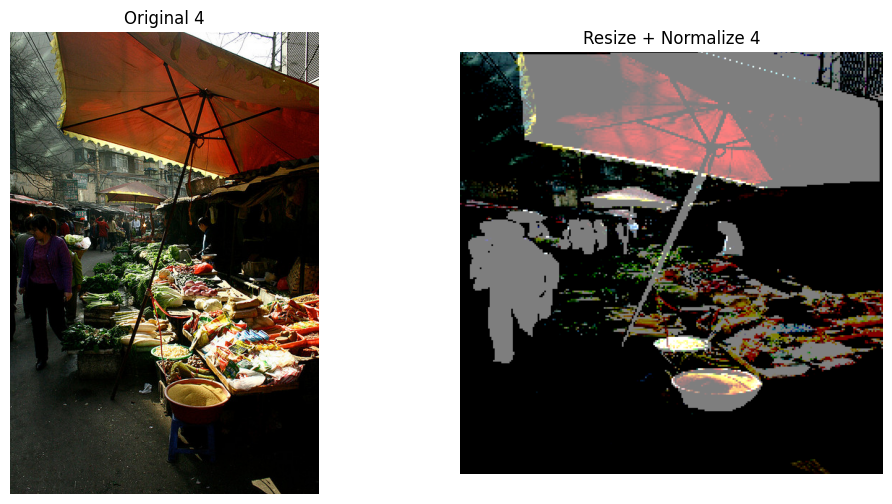

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.6225708].


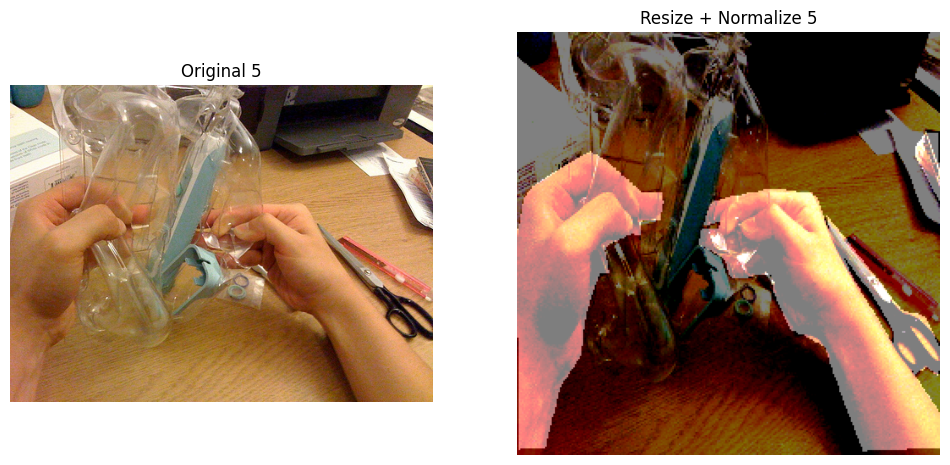

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.4831371].


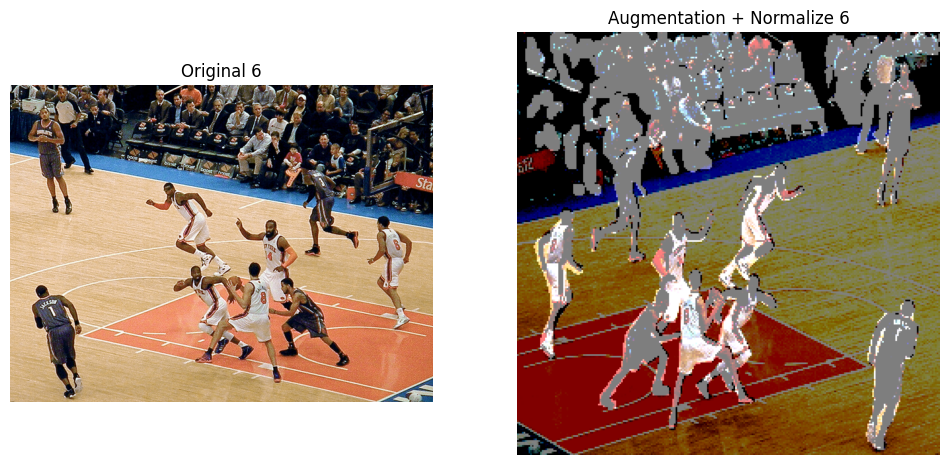

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.212885..2.6399999].


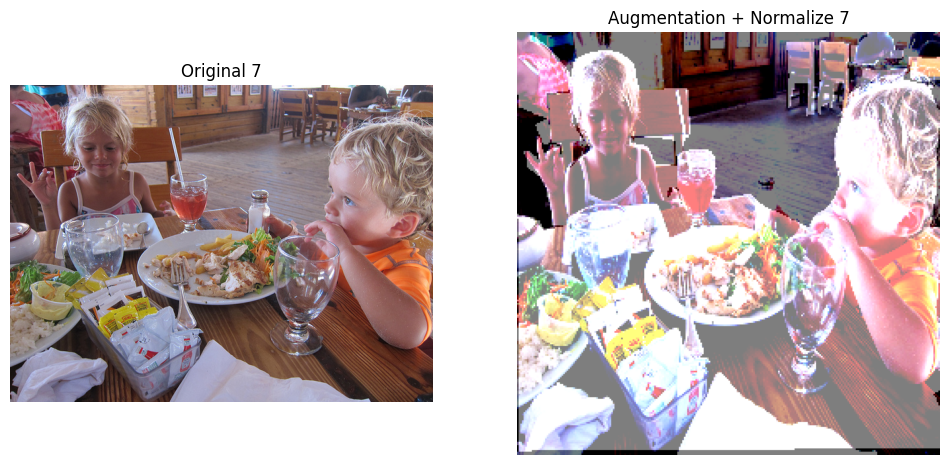

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.6399999].


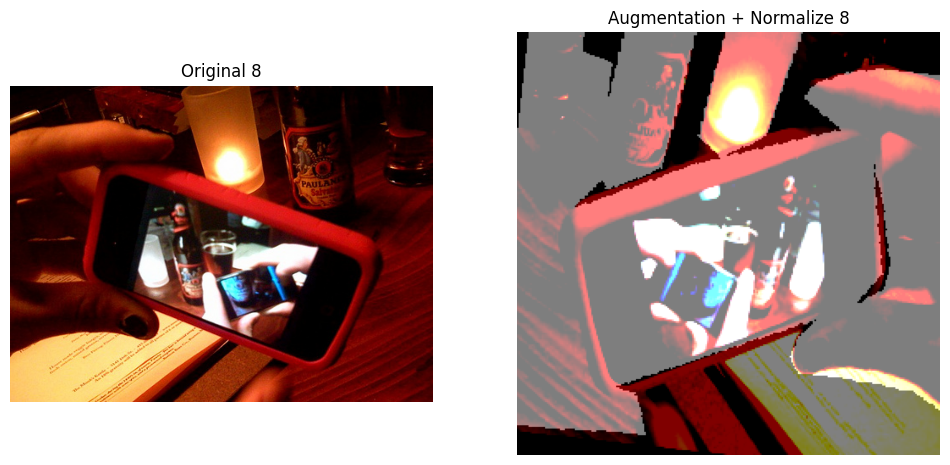

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.5877123].


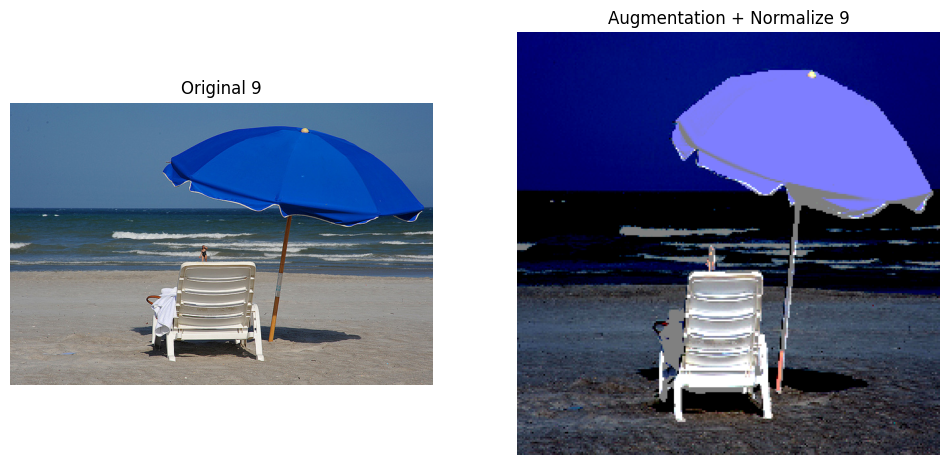

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.6399999].


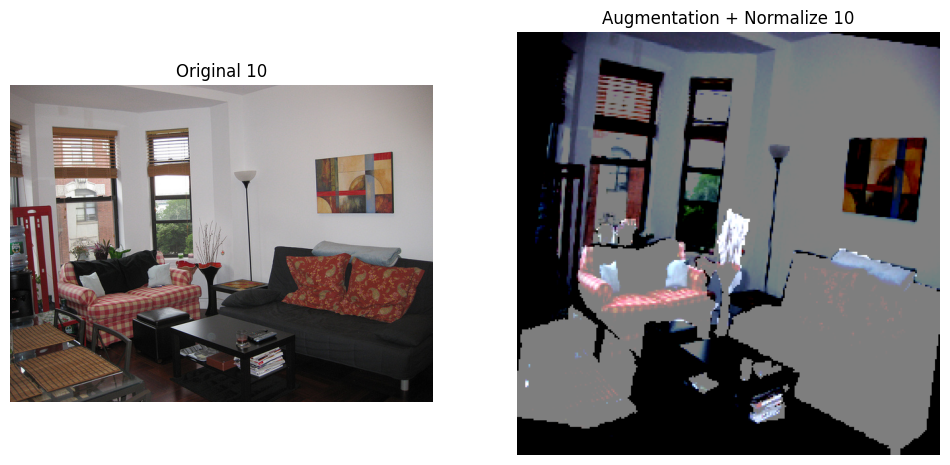

In [2]:
import os
import random
import numpy as np
import matplotlib.pyplot as plt
from pycocotools.coco import COCO
from PIL import Image
import albumentations as A
from albumentations.pytorch import ToTensorV2

# Path setup
dataDir = r"C:/Users/rahul/Downloads/coco"
dataType = "val2017"
annFile = f"{dataDir}/annotations/instances_{dataType}.json"

# Initialize COCO API
coco = COCO(annFile)

# Get all image IDs
imgIds = coco.getImgIds()

# Select 10 random images
random_ids = random.sample(imgIds, 10)

# ----- Pipelines -----
# 1. Resize + Normalize
resize_norm = A.Compose([
    A.Resize(256, 256),
    A.Normalize(mean=(0.485, 0.456, 0.406),
                std=(0.229, 0.224, 0.225)),
    ToTensorV2()
])

# 2. Resize + Augmentation + Normalize
augment = A.Compose([
    A.Resize(256, 256),
    A.HorizontalFlip(p=0.5),
    A.RandomBrightnessContrast(p=0.3),
    A.ShiftScaleRotate(shift_limit=0.05, scale_limit=0.1, rotate_limit=15, p=0.5),
    A.Normalize(mean=(0.485, 0.456, 0.406),
                std=(0.229, 0.224, 0.225)),
    ToTensorV2()
])

for i, imgId in enumerate(random_ids):
    img = coco.loadImgs(imgId)[0]
    I = Image.open(os.path.join(f"{dataDir}/{dataType}", img['file_name'])).convert("RGB")
    I_np = np.array(I)

    # Load annotations
    annIds = coco.getAnnIds(imgIds=img['id'])
    anns = coco.loadAnns(annIds)

    # Create mask
    mask = np.zeros((img['height'], img['width']), dtype=np.uint8)
    for ann in anns:
        mask = np.maximum(mask, coco.annToMask(ann))

    # Apply different pipelines
    if i < 5:  # First 5 → resize + normalize
        transformed = resize_norm(image=I_np, mask=mask)
        mode = "Resize + Normalize"
    else:      # Next 5 → augmentation
        transformed = augment(image=I_np, mask=mask)
        mode = "Augmentation + Normalize"

    img_t = transformed["image"]
    mask_t = transformed["mask"]

    # Convert back for visualization
    img_viz = img_t.permute(1, 2, 0).cpu().numpy()
    mask_viz = mask_t.cpu().numpy()

    # Show results
    plt.figure(figsize=(12,6))

    # Original
    plt.subplot(1,2,1)
    plt.imshow(I_np)
    plt.axis('off')
    plt.title(f"Original {i+1}")

    # Preprocessed
    plt.subplot(1,2,2)
    plt.imshow(img_viz)
    plt.imshow(mask_viz, cmap="gray", alpha=0.5)  # overlay mask
    plt.axis('off')
    plt.title(f"{mode} {i+1}")

    plt.show()


In [1]:
import os
import random
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, random_split
from torchvision.models.segmentation import deeplabv3_resnet50, DeepLabV3_ResNet50_Weights
from pycocotools.coco import COCO
from tqdm import tqdm   # ✅ progress bar

# -------------------------
# 1. Dataset Class
# -------------------------
class COCODataset(Dataset):
    def __init__(self, root, annFile, transforms=None):
        self.root = root
        self.coco = COCO(annFile)
        self.ids = list(self.coco.imgs.keys())
        self.transforms = transforms

    def __getitem__(self, index):
        img_id = self.ids[index]
        img_info = self.coco.loadImgs(img_id)[0]
        path = img_info['file_name']

        # Load image
        img = Image.open(os.path.join(self.root, path)).convert("RGB")
        img = np.array(img)

        # Load mask
        ann_ids = self.coco.getAnnIds(imgIds=img_id)
        anns = self.coco.loadAnns(ann_ids)
        mask = np.zeros((img_info['height'], img_info['width']), dtype=np.uint8)
        for ann in anns:
            mask = np.maximum(mask, self.coco.annToMask(ann))

        if self.transforms is not None:
            augmented = self.transforms(image=img, mask=mask)
            img = augmented["image"]
            mask = augmented["mask"]

        return img, mask.long()

    def __len__(self):
        return len(self.ids)

# -------------------------
# 2. Transforms
# -------------------------
import albumentations as A
from albumentations.pytorch import ToTensorV2

train_transforms = A.Compose([
    A.Resize(256, 256),
    A.HorizontalFlip(p=0.5),
    A.RandomBrightnessContrast(p=0.2),
    A.Affine(scale=(0.9, 1.1), translate_percent=(0.05, 0.05),
             rotate=(-15, 15), p=0.3),  # replaces ShiftScaleRotate
    A.Normalize(mean=(0.485, 0.456, 0.406),
                std=(0.229, 0.224, 0.225)),
    ToTensorV2()
])

val_transforms = A.Compose([
    A.Resize(256, 256),
    A.Normalize(mean=(0.485, 0.456, 0.406),
                std=(0.229, 0.224, 0.225)),
    ToTensorV2()
])

# -------------------------
# Main Training Block
# -------------------------
if __name__ == "__main__":
    dataDir = r"C:/Users/rahul/Downloads/coco"
    annFile = f"{dataDir}/annotations/instances_val2017.json"

    full_dataset = COCODataset(root=f"{dataDir}/val2017", annFile=annFile, transforms=train_transforms)

    train_size = int(0.8 * len(full_dataset))
    val_size = len(full_dataset) - train_size
    train_dataset, val_dataset = random_split(full_dataset, [train_size, val_size])
    val_dataset.dataset.transforms = val_transforms

    # ⚠️ num_workers=0 on Windows
    train_loader = DataLoader(train_dataset, batch_size=2, shuffle=True, num_workers=0)
    val_loader = DataLoader(val_dataset, batch_size=2, shuffle=False, num_workers=0)

    # -------------------------
    # Model
    # -------------------------
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print("Using:", device)

    weights = DeepLabV3_ResNet50_Weights.DEFAULT
    model = deeplabv3_resnet50(weights=weights)
    model.classifier[4] = nn.Conv2d(256, 1, kernel_size=1)  # binary seg
    model = model.to(device)

    # -------------------------
    # Loss + Optimizer
    # -------------------------
    class DiceLoss(nn.Module):
        def __init__(self, smooth=1):
            super(DiceLoss, self).__init__()
            self.smooth = smooth
        def forward(self, logits, targets):
            probs = torch.sigmoid(logits)
            targets = targets.float()
            intersection = (probs * targets).sum()
            dice = (2. * intersection + self.smooth) / (probs.sum() + targets.sum() + self.smooth)
            return 1 - dice

    criterion_bce = nn.BCEWithLogitsLoss()
    criterion_dice = DiceLoss()
    optimizer = optim.Adam(model.parameters(), lr=1e-4)

    # AMP scaler
    scaler = torch.amp.GradScaler("cuda")

    # -------------------------
    # Metrics
    # -------------------------
    def iou_score(pred, target):
        pred = (pred > 0.5).float()
        intersection = (pred * target).sum()
        union = pred.sum() + target.sum() - intersection
        return (intersection + 1e-6) / (union + 1e-6)

    def dice_score(pred, target):
        pred = (pred > 0.5).float()
        intersection = (pred * target).sum()
        return (2. * intersection + 1e-6) / (pred.sum() + target.sum() + 1e-6)

    def pixel_accuracy(pred, target):
        pred = (pred > 0.5).float()
        correct = (pred == target).float().sum()
        total = torch.numel(pred)
        return correct / total

    # -------------------------
    # Training Loop with AMP + tqdm
    # -------------------------
    epochs = 10
    for epoch in range(epochs):
        model.train()
        epoch_loss = 0
        loop = tqdm(train_loader, desc=f"Epoch {epoch+1}/{epochs}", leave=True)

        for imgs, masks in loop:
            imgs, masks = imgs.to(device), masks.to(device)
            masks = masks.unsqueeze(1)

            with torch.amp.autocast("cuda"):   # ✅ fixed everywhere
                outputs = model(imgs)["out"]
                loss = criterion_bce(outputs, masks.float()) + criterion_dice(outputs, masks)

            optimizer.zero_grad()
            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()

            epoch_loss += loss.item()
            loop.set_postfix(loss=loss.item())  # show batch loss

        # Validation
        model.eval()
        val_loss, val_iou, val_dice, val_acc = 0, 0, 0, 0
        with torch.no_grad():
            for imgs, masks in val_loader:
                imgs, masks = imgs.to(device), masks.to(device)
                masks = masks.unsqueeze(1)

                with torch.amp.autocast("cuda"):   # ✅ fixed here too
                    outputs = model(imgs)["out"]
                    loss = criterion_bce(outputs, masks.float()) + criterion_dice(outputs, masks)

                val_loss += loss.item()
                preds = torch.sigmoid(outputs)
                val_iou += iou_score(preds, masks).item()
                val_dice += dice_score(preds, masks).item()
                val_acc += pixel_accuracy(preds, masks).item()

        print(f"\nEpoch {epoch+1}/{epochs} Summary | "
              f"Train Loss: {epoch_loss/len(train_loader):.4f} | "
              f"Val Loss: {val_loss/len(val_loader):.4f} | "
              f"IoU: {val_iou/len(val_loader):.4f} | "
              f"Dice: {val_dice/len(val_loader):.4f} | "
              f"Acc: {val_acc/len(val_loader):.4f}")

    # -------------------------
    # Save Model (Safe)
    # -------------------------
    save_path = r"C:\Users\rahul\Downloads\infosys project\deeplabv3_binary_amp.pth"
    torch.save(model.cpu().state_dict(), save_path)   # save safely on CPU
    model.to(device)  # send back to GPU if needed
    print(f"✅ Model saved at {save_path}")


loading annotations into memory...
Done (t=0.72s)
creating index...
index created!
Using: cuda


Epoch 1/10: 100%|██████████████████████████████████████████████████████| 2000/2000 [05:12<00:00,  6.40it/s, loss=0.752]



Epoch 1/10 Summary | Train Loss: 0.8636 | Val Loss: 0.7435 | IoU: 0.5604 | Dice: 0.6987 | Acc: 0.8348


Epoch 2/10: 100%|██████████████████████████████████████████████████████| 2000/2000 [04:49<00:00,  6.90it/s, loss=0.515]



Epoch 2/10 Summary | Train Loss: 0.7751 | Val Loss: 0.7554 | IoU: 0.5581 | Dice: 0.6882 | Acc: 0.8345


Epoch 3/10: 100%|██████████████████████████████████████████████████████| 2000/2000 [04:39<00:00,  7.17it/s, loss=0.923]



Epoch 3/10 Summary | Train Loss: 0.7170 | Val Loss: 0.7021 | IoU: 0.5867 | Dice: 0.7189 | Acc: 0.8513


Epoch 4/10: 100%|██████████████████████████████████████████████████████| 2000/2000 [04:39<00:00,  7.15it/s, loss=0.979]



Epoch 4/10 Summary | Train Loss: 0.6645 | Val Loss: 0.7073 | IoU: 0.5664 | Dice: 0.6994 | Acc: 0.8514


Epoch 5/10: 100%|██████████████████████████████████████████████████████| 2000/2000 [04:45<00:00,  6.99it/s, loss=0.897]



Epoch 5/10 Summary | Train Loss: 0.6200 | Val Loss: 0.7006 | IoU: 0.5672 | Dice: 0.6984 | Acc: 0.8557


Epoch 6/10: 100%|███████████████████████████████████████████████████████| 2000/2000 [04:53<00:00,  6.81it/s, loss=1.28]



Epoch 6/10 Summary | Train Loss: 0.5736 | Val Loss: 0.7311 | IoU: 0.5539 | Dice: 0.6867 | Acc: 0.8456


Epoch 7/10: 100%|██████████████████████████████████████████████████████| 2000/2000 [04:46<00:00,  6.98it/s, loss=0.284]



Epoch 7/10 Summary | Train Loss: 0.5346 | Val Loss: 0.7371 | IoU: 0.5574 | Dice: 0.6886 | Acc: 0.8518


Epoch 8/10: 100%|██████████████████████████████████████████████████████| 2000/2000 [04:42<00:00,  7.07it/s, loss=0.894]



Epoch 8/10 Summary | Train Loss: 0.5001 | Val Loss: 0.7284 | IoU: 0.5716 | Dice: 0.7047 | Acc: 0.8519


Epoch 9/10: 100%|██████████████████████████████████████████████████████| 2000/2000 [04:48<00:00,  6.93it/s, loss=0.509]



Epoch 9/10 Summary | Train Loss: 0.4573 | Val Loss: 0.7389 | IoU: 0.5656 | Dice: 0.6978 | Acc: 0.8407


Epoch 10/10: 100%|█████████████████████████████████████████████████████| 2000/2000 [04:53<00:00,  6.80it/s, loss=0.323]



Epoch 10/10 Summary | Train Loss: 0.4455 | Val Loss: 0.7127 | IoU: 0.5850 | Dice: 0.7141 | Acc: 0.8526
✅ Model saved at C:\Users\rahul\Downloads\infosys project\deeplabv3_binary_amp.pth


loading annotations into memory...
Done (t=0.97s)
creating index...
index created!


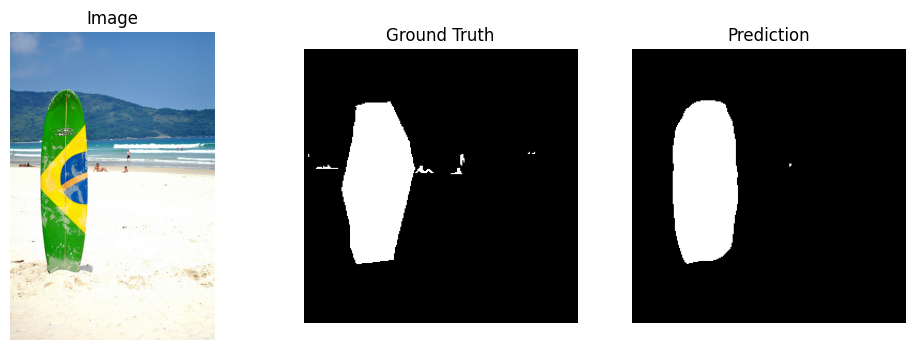

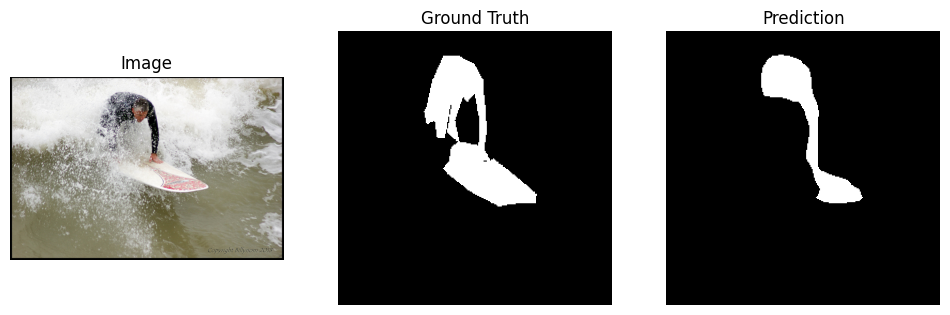

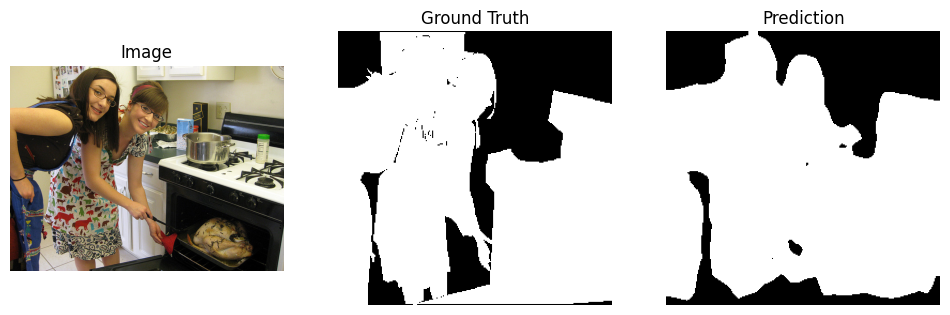

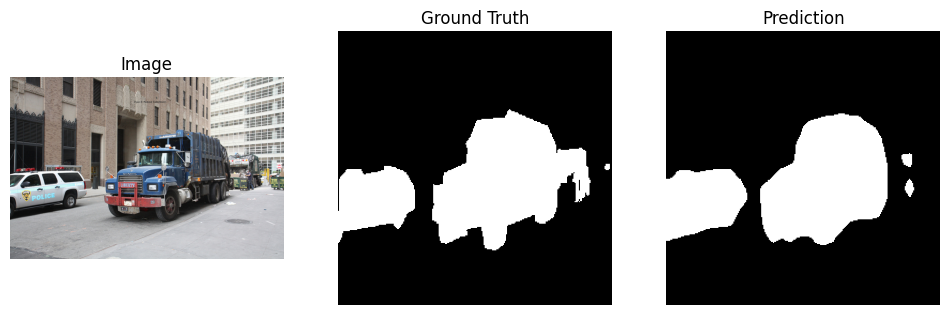

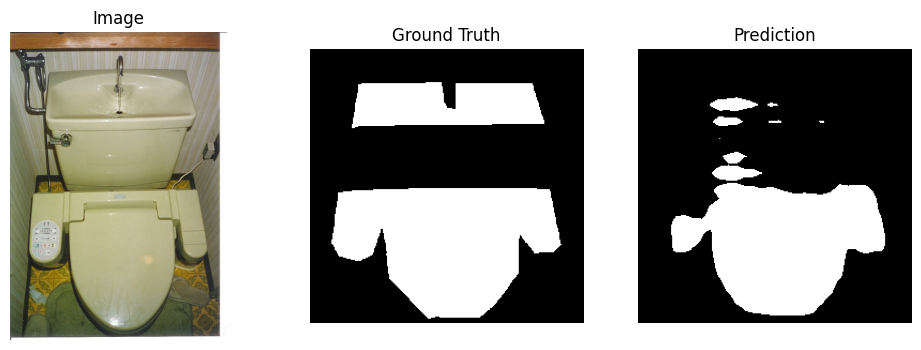

...

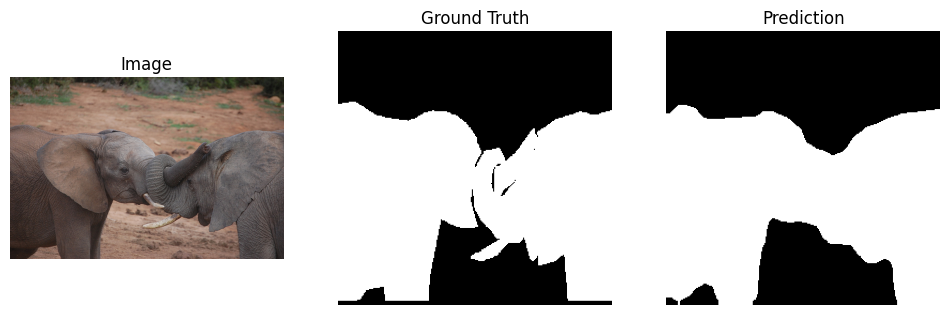

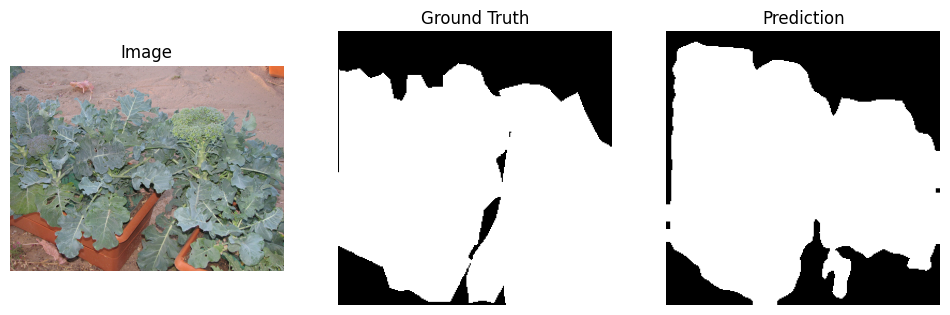

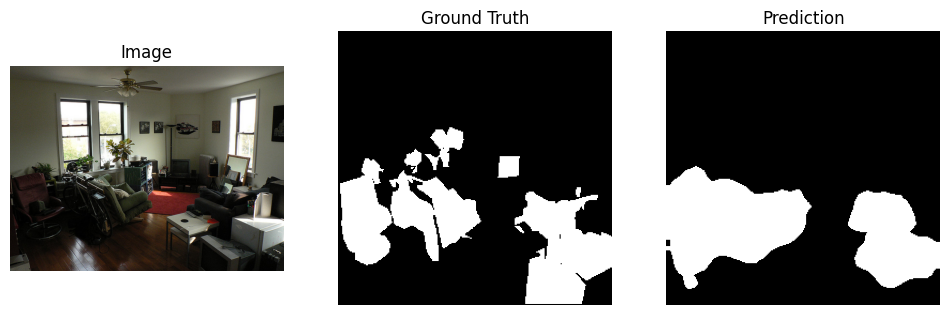

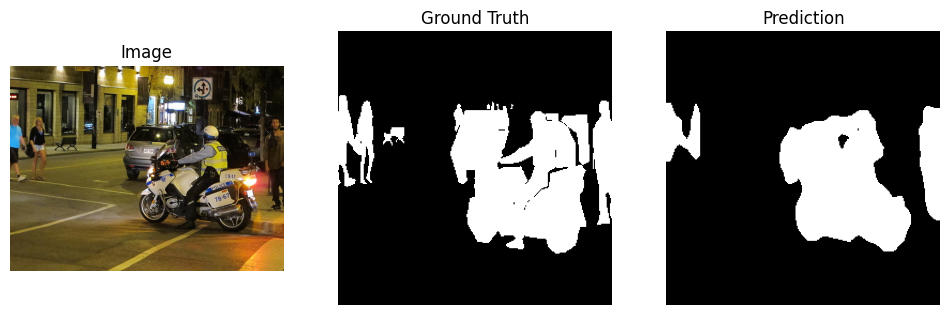

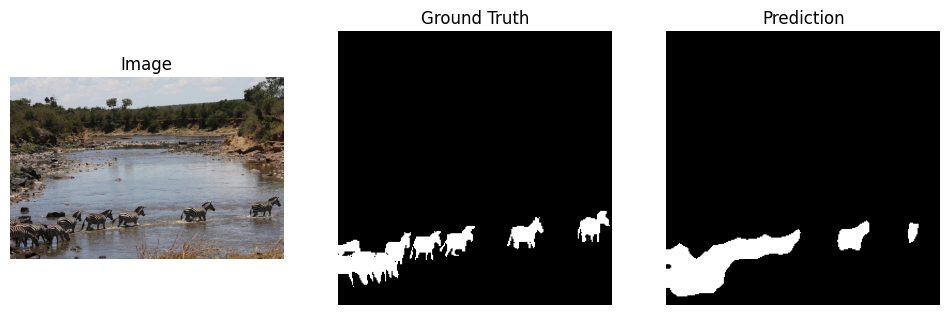

In [4]:
import os
import random
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

import torch
from torchvision.models.segmentation import deeplabv3_resnet50, DeepLabV3_ResNet50_Weights
from pycocotools.coco import COCO
import albumentations as A
from albumentations.pytorch import ToTensorV2

# -------------------------
# Load trained model
# -------------------------
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

weights = DeepLabV3_ResNet50_Weights.DEFAULT
model = deeplabv3_resnet50(weights=weights)
model.classifier[4] = torch.nn.Conv2d(256, 1, kernel_size=1)
model.load_state_dict(torch.load(
    r"C:\Users\rahul\Downloads\infosys project\deeplabv3_binary_amp.pth",
    map_location=device
))
model = model.to(device)
model.eval()

# -------------------------
# Dataset & COCO
# -------------------------
dataDir = r"C:\Users\rahul\Downloads\coco"
annFile = f"{dataDir}/annotations/instances_val2017.json"
coco = COCO(annFile)
val_dir = f"{dataDir}/val2017"

# transforms (same as val)
val_transforms = A.Compose([
    A.Resize(256, 256),
    A.Normalize(mean=(0.485, 0.456, 0.406),
                std=(0.229, 0.224, 0.225)),
    ToTensorV2()
])

resize_only = A.Resize(256, 256)  # for ground truth resizing

# -------------------------
# Prediction & Plot
# -------------------------
def visualize_predictions(num_images=10):
    img_ids = random.sample(coco.getImgIds(), num_images)

    for img_id in img_ids:
        img_info = coco.loadImgs(img_id)[0]
        img_path = os.path.join(val_dir, img_info['file_name'])

        # Load image
        img = Image.open(img_path).convert("RGB")
        img_np = np.array(img)

        # Load ground truth mask
        ann_ids = coco.getAnnIds(imgIds=img_id)
        anns = coco.loadAnns(ann_ids)
        mask = np.zeros((img_info['height'], img_info['width']), dtype=np.uint8)
        for ann in anns:
            mask = np.maximum(mask, coco.annToMask(ann))

        # Resize GT mask
        mask_resized = resize_only(image=mask)["image"]

        # Prediction
        augmented = val_transforms(image=img_np)
        tensor_img = augmented["image"].unsqueeze(0).to(device)
        with torch.no_grad():
            output = model(tensor_img)["out"]
            pred_mask = torch.sigmoid(output).squeeze().cpu().numpy()
            pred_mask = (pred_mask > 0.5).astype(np.uint8)

        # Plot side-by-side
        plt.figure(figsize=(12, 4))
        
        plt.subplot(1, 3, 1)
        plt.imshow(img_np)
        plt.title("Image")
        plt.axis("off")

        plt.subplot(1, 3, 2)
        plt.imshow(mask_resized, cmap="gray")
        plt.title("Ground Truth")
        plt.axis("off")

        plt.subplot(1, 3, 3)
        plt.imshow(pred_mask, cmap="gray")
        plt.title("Prediction")
        plt.axis("off")

        plt.show()

# -------------------------
# Run visualization
# -------------------------
visualize_predictions(num_images=12)


In [6]:
from torch.utils.data import DataLoader

# --- reuse dataset and transforms ---
val_dataset = COCODataset(root=f"{dataDir}/val2017", annFile=annFile, transforms=val_transforms)
val_loader = DataLoader(val_dataset, batch_size=2, shuffle=False, num_workers=0)

# Evaluation loop
def evaluate_model(model, loader):
    model.eval()
    val_loss, val_iou, val_dice, val_acc = 0, 0, 0, 0
    criterion_bce = nn.BCEWithLogitsLoss()
    criterion_dice = DiceLoss()

    with torch.no_grad():
        for imgs, masks in tqdm(loader, desc="Evaluating"):
            imgs, masks = imgs.to(device), masks.to(device)
            masks = masks.unsqueeze(1)

            with torch.amp.autocast("cuda"):
                outputs = model(imgs)["out"]
                loss = criterion_bce(outputs, masks.float()) + criterion_dice(outputs, masks)

            val_loss += loss.item()
            preds = torch.sigmoid(outputs)
            val_iou += iou_score(preds, masks).item()
            val_dice += dice_score(preds, masks).item()
            val_acc += pixel_accuracy(preds, masks).item()

    n = len(loader)
    print(f"\n🔎 Test Evaluation Results:\n"
          f"Val Loss: {val_loss/n:.4f} | IoU: {val_iou/n:.4f} | Dice: {val_dice/n:.4f} | Acc: {val_acc/n:.4f}")

# Run test accuracy
evaluate_model(model, val_loader)


loading annotations into memory...
Done (t=1.48s)
creating index...
index created!


Evaluating: 100%|██████████████████████████████████████████████████████████████████| 2500/2500 [02:23<00:00, 17.40it/s]


🔎 Test Evaluation Results:
Val Loss: 0.4681 | IoU: 0.7032 | Dice: 0.8098 | Acc: 0.9089


# Updated code for better accuracy

In [5]:
import os
import random
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, random_split
from torchvision.models.segmentation import deeplabv3_resnet101, DeepLabV3_ResNet101_Weights
from pycocotools.coco import COCO
from tqdm import tqdm
import albumentations as A
from albumentations.pytorch import ToTensorV2

# -------------------------
# 1. Dataset Class
# -------------------------
class COCODataset(Dataset):
    def __init__(self, root, annFile, transforms=None):
        self.root = root
        self.coco = COCO(annFile)
        self.ids = list(self.coco.imgs.keys())
        self.transforms = transforms

    def __getitem__(self, index):
        img_id = self.ids[index]
        img_info = self.coco.loadImgs(img_id)[0]
        path = img_info['file_name']

        # Load image
        img = Image.open(os.path.join(self.root, path)).convert("RGB")
        img = np.array(img)

        # Load mask
        ann_ids = self.coco.getAnnIds(imgIds=img_id)
        anns = self.coco.loadAnns(ann_ids)
        mask = np.zeros((img_info['height'], img_info['width']), dtype=np.uint8)
        for ann in anns:
            mask = np.maximum(mask, self.coco.annToMask(ann))

        if self.transforms is not None:
            augmented = self.transforms(image=img, mask=mask)
            img = augmented["image"]
            mask = augmented["mask"]

        return img, mask.long()

    def __len__(self):
        return len(self.ids)


# -------------------------
# 2. Transforms
# -------------------------
train_transforms = A.Compose([
    A.Resize(256, 256),
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.2),
    A.RandomRotate90(p=0.3),
    A.RandomBrightnessContrast(p=0.3),
    A.ColorJitter(p=0.3),
    A.GaussianBlur(p=0.2),
    A.Affine(scale=(0.9, 1.1), translate_percent=(0.05, 0.05), rotate=(-20, 20), p=0.3),
    A.Normalize(mean=(0.485, 0.456, 0.406),
                std=(0.229, 0.224, 0.225)),
    ToTensorV2()
])

val_transforms = A.Compose([
    A.Resize(256, 256),
    A.Normalize(mean=(0.485, 0.456, 0.406),
                std=(0.229, 0.224, 0.225)),
    ToTensorV2()
])


# -------------------------
# 3. Loss Functions
# -------------------------
class DiceLoss(nn.Module):
    def __init__(self, smooth=1):
        super(DiceLoss, self).__init__()
        self.smooth = smooth
    def forward(self, logits, targets):
        probs = torch.sigmoid(logits)
        targets = targets.float()
        intersection = (probs * targets).sum()
        dice = (2. * intersection + self.smooth) / (probs.sum() + targets.sum() + self.smooth)
        return 1 - dice

class FocalLoss(nn.Module):
    def __init__(self, alpha=1, gamma=2):
        super(FocalLoss, self).__init__()
        self.alpha = alpha
        self.gamma = gamma
        self.bce = nn.BCEWithLogitsLoss(reduction="none")
    def forward(self, logits, targets):
        bce_loss = self.bce(logits, targets)
        probs = torch.sigmoid(logits)
        pt = torch.where(targets == 1, probs, 1 - probs)
        focal = self.alpha * (1 - pt) ** self.gamma * bce_loss
        return focal.mean()


# -------------------------
# 4. Training Function
# -------------------------
def train_model(model, train_loader, val_loader, device, save_path, epochs=30):

    criterion_bce = nn.BCEWithLogitsLoss()
    criterion_dice = DiceLoss()
    criterion_focal = FocalLoss()

    optimizer = optim.Adam(model.parameters(), lr=1e-4, weight_decay=1e-5)
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', patience=3, factor=0.5)

    scaler = torch.amp.GradScaler("cuda")

    best_iou = 0
    patience, patience_counter = 7, 0  # early stopping

    for epoch in range(epochs):
        # -------------------------
        # Train
        # -------------------------
        model.train()
        epoch_loss = 0
        loop = tqdm(train_loader, desc=f"Epoch {epoch+1}/{epochs}", leave=True)

        for imgs, masks in loop:
            imgs, masks = imgs.to(device), masks.to(device)
            masks = masks.unsqueeze(1)

            with torch.amp.autocast("cuda"):
                outputs = model(imgs)["out"]
                loss = (0.4 * criterion_bce(outputs, masks.float()) +
                        0.3 * criterion_dice(outputs, masks) +
                        0.3 * criterion_focal(outputs, masks.float()))

            optimizer.zero_grad()
            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()

            epoch_loss += loss.item()
            loop.set_postfix(loss=loss.item())

        # -------------------------
        # Validation
        # -------------------------
        model.eval()
        val_loss, val_iou, val_dice, val_acc = 0, 0, 0, 0
        with torch.no_grad():
            for imgs, masks in val_loader:
                imgs, masks = imgs.to(device), masks.to(device)
                masks = masks.unsqueeze(1)

                with torch.amp.autocast("cuda"):
                    outputs = model(imgs)["out"]
                    loss = (0.4 * criterion_bce(outputs, masks.float()) +
                            0.3 * criterion_dice(outputs, masks) +
                            0.3 * criterion_focal(outputs, masks.float()))

                val_loss += loss.item()
                preds = torch.sigmoid(outputs)
                val_iou += ((preds > 0.5).float() * masks).sum().item() / (
                    (preds > 0.5).float().sum().item() + masks.sum().item() - ((preds > 0.5).float() * masks).sum().item() + 1e-6
                )
                val_dice += (2. * ((preds > 0.5).float() * masks).sum().item() + 1e-6) / (
                    (preds > 0.5).float().sum().item() + masks.sum().item() + 1e-6
                )
                val_acc += (preds.round() == masks).float().mean().item()

        val_loss /= len(val_loader)
        val_iou /= len(val_loader)
        val_dice /= len(val_loader)
        val_acc /= len(val_loader)

        print(f"\nEpoch {epoch+1}/{epochs} | Train Loss: {epoch_loss/len(train_loader):.4f} | "
              f"Val Loss: {val_loss:.4f} | IoU: {val_iou:.4f} | Dice: {val_dice:.4f} | Acc: {val_acc:.4f}")

        # Learning rate schedule
        scheduler.step(val_loss)

        # Save best model
        if val_iou > best_iou:
            best_iou = val_iou
            torch.save(model.state_dict(), save_path)
            print(f"✅ Best model saved at {save_path} with IoU {best_iou:.4f}")
            patience_counter = 0
        else:
            patience_counter += 1
            if patience_counter >= patience:
                print("⏹ Early stopping triggered.")
                break


# -------------------------
# 5. Main Block
# -------------------------
if __name__ == "__main__":
    dataDir = r"C:/Users/rahul/Downloads/coco"
    annFile = f"{dataDir}/annotations/instances_val2017.json"

    full_dataset = COCODataset(root=f"{dataDir}/val2017", annFile=annFile, transforms=train_transforms)

    train_size = int(0.8 * len(full_dataset))
    val_size = len(full_dataset) - train_size
    train_dataset, val_dataset = random_split(full_dataset, [train_size, val_size])
    val_dataset.dataset.transforms = val_transforms

    train_loader = DataLoader(train_dataset, batch_size=4, shuffle=True, num_workers=0)
    val_loader = DataLoader(val_dataset, batch_size=4, shuffle=False, num_workers=0)

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print("Using:", device)

    # DeepLabV3 with ResNet101 backbone
    weights = DeepLabV3_ResNet101_Weights.DEFAULT
    model = deeplabv3_resnet101(weights=weights)
    model.classifier[4] = nn.Conv2d(256, 1, kernel_size=1)  # binary segmentation
    model = model.to(device)

    save_path = r"C:\Users\rahul\Downloads\infosys project\deeplabv3_binary_best.pth"
    train_model(model, train_loader, val_loader, device, save_path, epochs=50)


loading annotations into memory...
Done (t=2.97s)
creating index...
index created!
Using: cuda


Epoch 1/50: 100%|███████████████████████████████████████████████████████| 1000/1000 [07:17<00:00,  2.28it/s, loss=0.35]



Epoch 1/50 | Train Loss: 0.3235 | Val Loss: 0.2851 | IoU: 0.5887 | Dice: 0.7288 | Acc: 0.8388
✅ Best model saved at C:\Users\rahul\Downloads\infosys project\deeplabv3_binary_best.pth with IoU 0.5887


Epoch 2/50: 100%|███████████████████████████████████████████████████████| 1000/1000 [06:22<00:00,  2.62it/s, loss=0.25]



Epoch 2/50 | Train Loss: 0.2813 | Val Loss: 0.2892 | IoU: 0.5974 | Dice: 0.7356 | Acc: 0.8421
✅ Best model saved at C:\Users\rahul\Downloads\infosys project\deeplabv3_binary_best.pth with IoU 0.5974


Epoch 3/50: 100%|██████████████████████████████████████████████████████| 1000/1000 [05:07<00:00,  3.25it/s, loss=0.187]



Epoch 3/50 | Train Loss: 0.2593 | Val Loss: 0.2724 | IoU: 0.6116 | Dice: 0.7492 | Acc: 0.8554
✅ Best model saved at C:\Users\rahul\Downloads\infosys project\deeplabv3_binary_best.pth with IoU 0.6116


Epoch 4/50: 100%|███████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [05:04<00:00,  3.28it/s, loss=0.21]



Epoch 4/50 | Train Loss: 0.2312 | Val Loss: 0.2885 | IoU: 0.6028 | Dice: 0.7413 | Acc: 0.8394


Epoch 5/50: 100%|██████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [05:03<00:00,  3.30it/s, loss=0.316]



Epoch 5/50 | Train Loss: 0.2145 | Val Loss: 0.2922 | IoU: 0.6125 | Dice: 0.7493 | Acc: 0.8469
✅ Best model saved at C:\Users\rahul\Downloads\infosys project\deeplabv3_binary_best.pth with IoU 0.6125


Epoch 6/50: 100%|██████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [05:03<00:00,  3.30it/s, loss=0.236]



Epoch 6/50 | Train Loss: 0.1992 | Val Loss: 0.2757 | IoU: 0.6117 | Dice: 0.7477 | Acc: 0.8547


Epoch 7/50: 100%|██████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [05:02<00:00,  3.31it/s, loss=0.148]



Epoch 7/50 | Train Loss: 0.1781 | Val Loss: 0.2884 | IoU: 0.6167 | Dice: 0.7534 | Acc: 0.8558
✅ Best model saved at C:\Users\rahul\Downloads\infosys project\deeplabv3_binary_best.pth with IoU 0.6167


Epoch 8/50: 100%|███████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [05:02<00:00,  3.30it/s, loss=0.14]



Epoch 8/50 | Train Loss: 0.1423 | Val Loss: 0.2728 | IoU: 0.6450 | Dice: 0.7741 | Acc: 0.8663
✅ Best model saved at C:\Users\rahul\Downloads\infosys project\deeplabv3_binary_best.pth with IoU 0.6450


Epoch 9/50: 100%|██████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [05:02<00:00,  3.31it/s, loss=0.114]



Epoch 9/50 | Train Loss: 0.1218 | Val Loss: 0.2738 | IoU: 0.6392 | Dice: 0.7693 | Acc: 0.8699


Epoch 10/50: 100%|██████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [05:02<00:00,  3.30it/s, loss=0.13]



Epoch 10/50 | Train Loss: 0.1105 | Val Loss: 0.3005 | IoU: 0.6489 | Dice: 0.7769 | Acc: 0.8692
✅ Best model saved at C:\Users\rahul\Downloads\infosys project\deeplabv3_binary_best.pth with IoU 0.6489


Epoch 11/50: 100%|█████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [05:03<00:00,  3.30it/s, loss=0.115]



Epoch 11/50 | Train Loss: 0.1045 | Val Loss: 0.3163 | IoU: 0.6222 | Dice: 0.7574 | Acc: 0.8633


Epoch 12/50: 100%|████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [05:03<00:00,  3.30it/s, loss=0.0831]



Epoch 12/50 | Train Loss: 0.0917 | Val Loss: 0.2998 | IoU: 0.6493 | Dice: 0.7785 | Acc: 0.8703
✅ Best model saved at C:\Users\rahul\Downloads\infosys project\deeplabv3_binary_best.pth with IoU 0.6493


Epoch 13/50: 100%|████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [05:03<00:00,  3.30it/s, loss=0.0971]



Epoch 13/50 | Train Loss: 0.0825 | Val Loss: 0.3092 | IoU: 0.6546 | Dice: 0.7819 | Acc: 0.8719
✅ Best model saved at C:\Users\rahul\Downloads\infosys project\deeplabv3_binary_best.pth with IoU 0.6546


Epoch 14/50: 100%|████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [05:04<00:00,  3.29it/s, loss=0.0456]



Epoch 14/50 | Train Loss: 0.0770 | Val Loss: 0.3191 | IoU: 0.6500 | Dice: 0.7789 | Acc: 0.8716


Epoch 15/50: 100%|████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [05:03<00:00,  3.30it/s, loss=0.0713]



Epoch 15/50 | Train Loss: 0.0729 | Val Loss: 0.3245 | IoU: 0.6511 | Dice: 0.7796 | Acc: 0.8728


Epoch 16/50: 100%|████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [05:11<00:00,  3.21it/s, loss=0.0967]



Epoch 16/50 | Train Loss: 0.0678 | Val Loss: 0.3421 | IoU: 0.6535 | Dice: 0.7812 | Acc: 0.8754


Epoch 17/50: 100%|████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [05:15<00:00,  3.17it/s, loss=0.0902]



Epoch 17/50 | Train Loss: 0.0635 | Val Loss: 0.3382 | IoU: 0.6520 | Dice: 0.7800 | Acc: 0.8728


Epoch 18/50: 100%|████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [05:07<00:00,  3.25it/s, loss=0.0537]



Epoch 18/50 | Train Loss: 0.0610 | Val Loss: 0.3458 | IoU: 0.6479 | Dice: 0.7772 | Acc: 0.8718


Epoch 19/50: 100%|████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [05:05<00:00,  3.28it/s, loss=0.0592]



Epoch 19/50 | Train Loss: 0.0588 | Val Loss: 0.3701 | IoU: 0.6489 | Dice: 0.7775 | Acc: 0.8721


Epoch 20/50: 100%|████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [05:06<00:00,  3.26it/s, loss=0.0533]



Epoch 20/50 | Train Loss: 0.0558 | Val Loss: 0.3763 | IoU: 0.6500 | Dice: 0.7786 | Acc: 0.8722
⏹ Early stopping triggered.


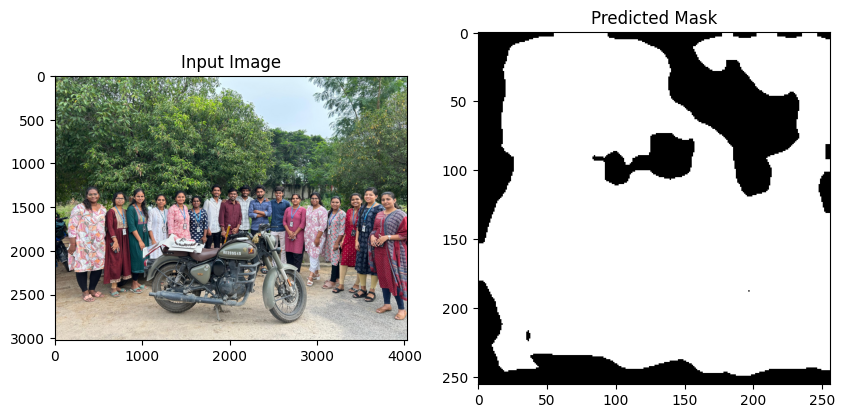

In [14]:
import torch
from torchvision import transforms
from torchvision.models.segmentation import deeplabv3_resnet50
from PIL import Image
import matplotlib.pyplot as plt

# -------------------------
# 1. Load model
# -------------------------
model = deeplabv3_resnet50(weights=None, num_classes=1)

checkpoint_path = r"C:\Users\rahul\Downloads\infosys project\deeplabv3_binary_best.pth"
state_dict = torch.load(checkpoint_path, map_location="cuda")
model.load_state_dict(state_dict, strict=False)

model.eval().cuda()

# -------------------------
# 2. Load an unseen image
# -------------------------
image_path = r"C:\Users\rahul\OneDrive\Desktop\WhatsApp Image 2025-09-12 at 16.32.05_5970c09d.jpg"  # <-- change this to your test image
image = Image.open(image_path).convert("RGB")

# Preprocess same as training (resize, normalize, tensor)
transform = transforms.Compose([
    transforms.Resize((256, 256)),   # must match training size
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

input_tensor = transform(image).unsqueeze(0).cuda()  # shape [1,3,H,W]

# -------------------------
# 3. Inference
# -------------------------
with torch.no_grad():
    output = model(input_tensor)['out']   # [1,1,H,W]
    pred = torch.sigmoid(output).squeeze().cpu().numpy()
    pred_mask = (pred > 0.5).astype("uint8")  # binary mask

# -------------------------
# 4. Show results
# -------------------------
plt.figure(figsize=(10,5))

plt.subplot(1,2,1)
plt.imshow(image)
plt.title("Input Image")

plt.subplot(1,2,2)
plt.imshow(pred_mask, cmap="gray")
plt.title("Predicted Mask")

plt.show()


loading annotations into memory...
Done (t=0.75s)
creating index...
index created!


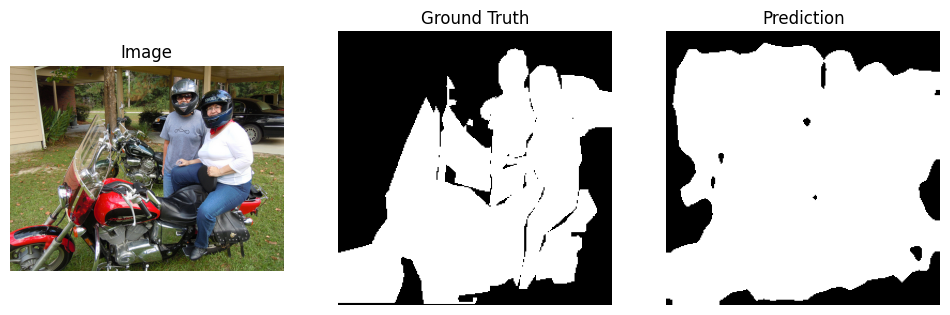

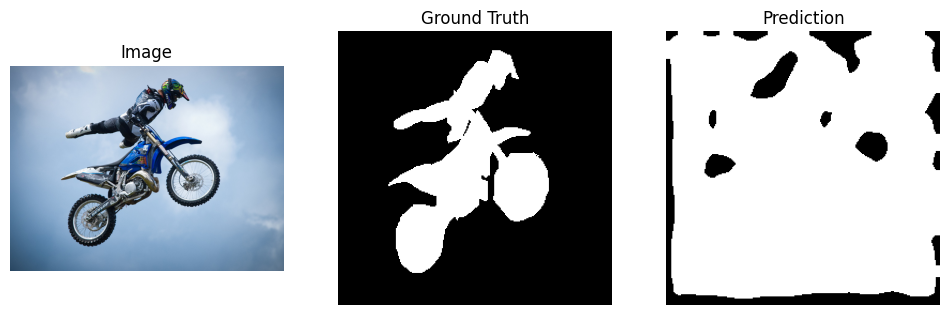

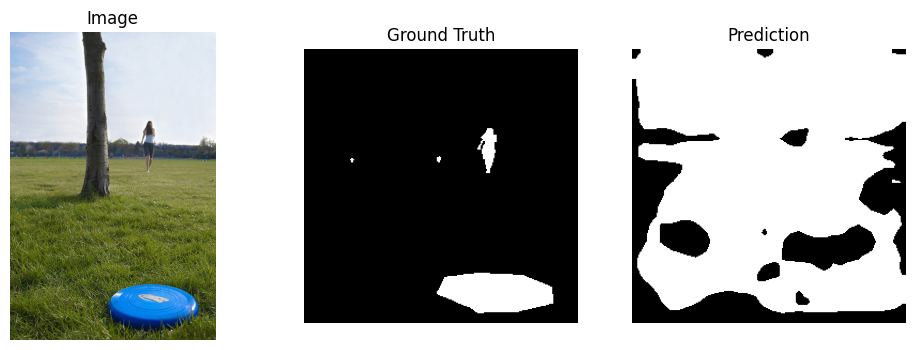

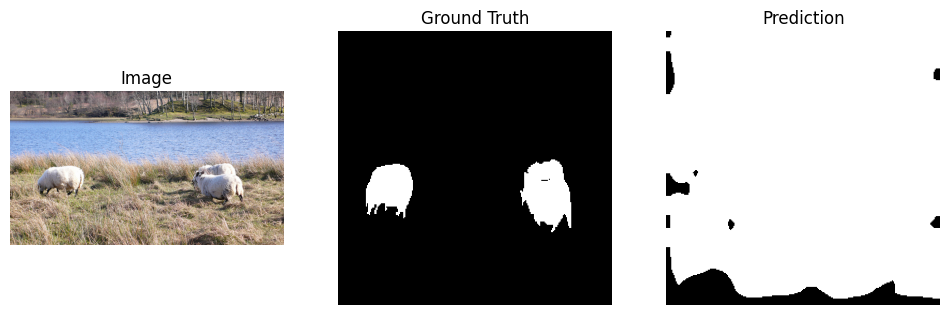

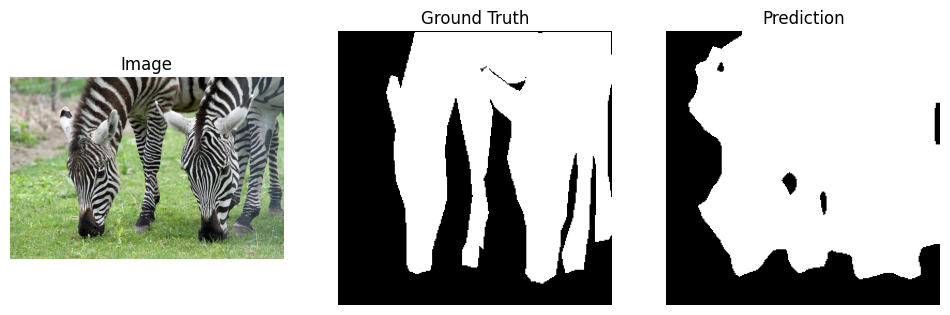

...

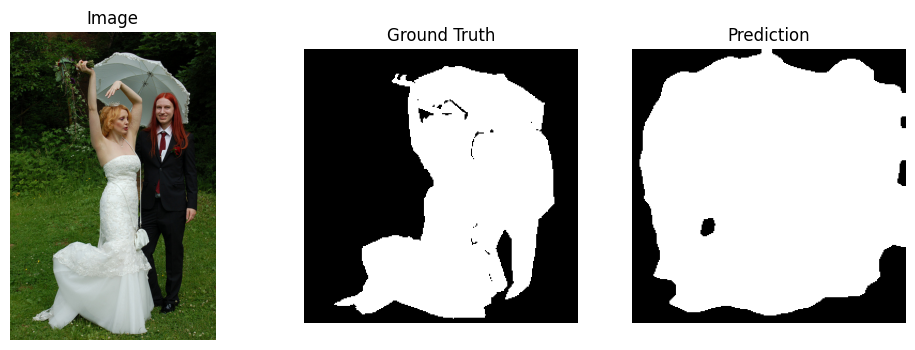

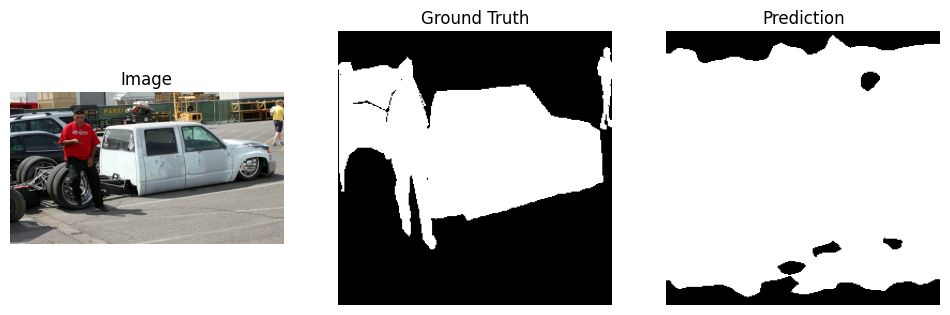

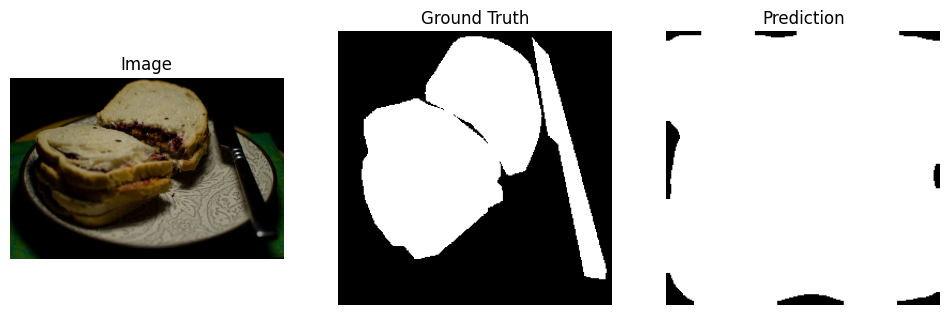

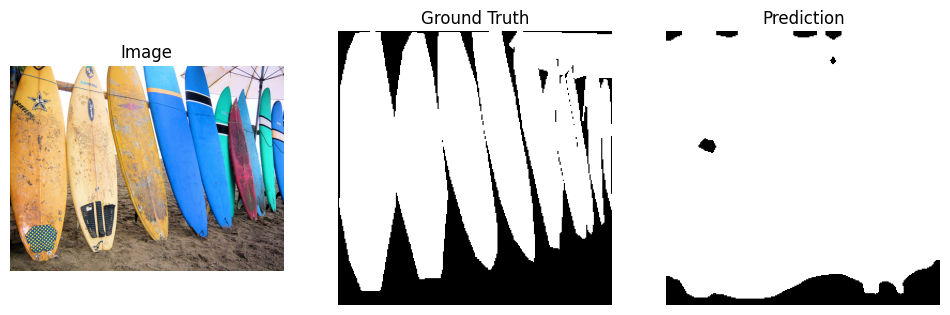

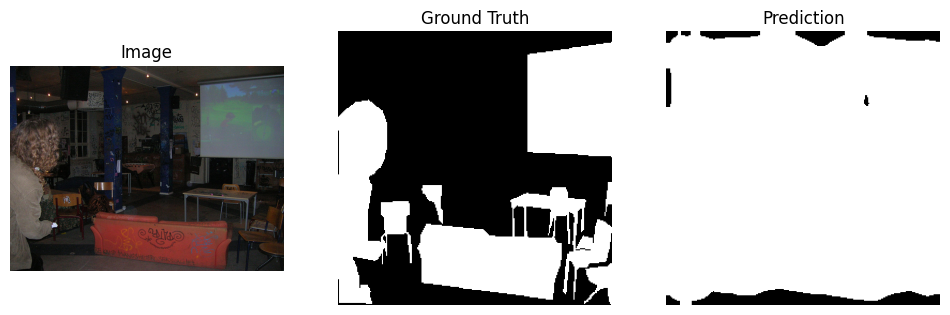

In [1]:
import os
import random
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

import torch
from torchvision.models.segmentation import deeplabv3_resnet50
from pycocotools.coco import COCO
import albumentations as A
from albumentations.pytorch import ToTensorV2

# -------------------------
# 1. Load trained model
# -------------------------
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = deeplabv3_resnet50(weights=None, num_classes=1)
checkpoint_path = r"C:\Users\rahul\Downloads\infosys project\deeplabv3_binary_best.pth"
state_dict = torch.load(checkpoint_path, map_location=device)
model.load_state_dict(state_dict, strict=False)
model = model.to(device)
model.eval()

# -------------------------
# 2. Dataset & COCO
# -------------------------
dataDir = r"C:\Users\rahul\Downloads\coco"
annFile = f"{dataDir}/annotations/instances_val2017.json"
coco = COCO(annFile)
val_dir = f"{dataDir}/val2017"

# validation transforms
val_transforms = A.Compose([
    A.Resize(256, 256),
    A.Normalize(mean=(0.485, 0.456, 0.406),
                std=(0.229, 0.224, 0.225)),
    ToTensorV2()
])
resize_only = A.Resize(256, 256)  # for resizing ground truth masks

# -------------------------
# 3. Prediction & Plot
# -------------------------
def visualize_predictions(num_images=10):
    img_ids = random.sample(coco.getImgIds(), num_images)

    for img_id in img_ids:
        img_info = coco.loadImgs(img_id)[0]
        img_path = os.path.join(val_dir, img_info['file_name'])

        # Load image
        img = Image.open(img_path).convert("RGB")
        img_np = np.array(img)

        # Ground truth mask
        ann_ids = coco.getAnnIds(imgIds=img_id)
        anns = coco.loadAnns(ann_ids)
        mask = np.zeros((img_info['height'], img_info['width']), dtype=np.uint8)
        for ann in anns:
            mask = np.maximum(mask, coco.annToMask(ann))
        mask_resized = resize_only(image=mask)["image"]

        # Prediction
        augmented = val_transforms(image=img_np)
        tensor_img = augmented["image"].unsqueeze(0).to(device)
        with torch.no_grad():
            output = model(tensor_img)["out"]
            pred_mask = torch.sigmoid(output).squeeze().cpu().numpy()
            pred_mask = (pred_mask > 0.5).astype(np.uint8)

        # Plot side-by-side
        plt.figure(figsize=(12, 4))
        
        plt.subplot(1, 3, 1)
        plt.imshow(img_np)
        plt.title("Image")
        plt.axis("off")

        plt.subplot(1, 3, 2)
        plt.imshow(mask_resized, cmap="gray")
        plt.title("Ground Truth")
        plt.axis("off")

        plt.subplot(1, 3, 3)
        plt.imshow(pred_mask, cmap="gray")
        plt.title("Prediction")
        plt.axis("off")

        plt.show()

# -------------------------
# Run visualization
# -------------------------
visualize_predictions(num_images=12)
